In [17]:
import os
import numpy as np
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

IMG_SIZE=64

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
val_transform = transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.ToTensor(),
    ])
aug_transform = transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.ToTensor(),
    ])

def get_cycleGAN_dataloaders(data_dir, batch_size=32, shuffle=True, transform=val_transform):
    # For CycleGAN, we need two domains: A (cat) and B (dog)
    dataset = datasets.ImageFolder(root=data_dir, transform=transform)
    cat_indices = [i for i, (_, label) in enumerate(dataset.samples) if label == 0]
    dog_indices = [i for i, (_, label) in enumerate(dataset.samples) if label == 1]
    cat_dataset = Subset(dataset, cat_indices)
    dog_dataset = Subset(dataset, dog_indices)
    cat_loader = DataLoader(cat_dataset, batch_size=batch_size, shuffle=shuffle)
    dog_loader = DataLoader(dog_dataset, batch_size=batch_size, shuffle=shuffle)
    return cat_loader, dog_loader, dataset.classes

In [18]:
def show_cycleGAN_batch(cat_loader, dog_loader, classes):
    cat_images, _ = next(iter(cat_loader))
    dog_images, _ = next(iter(dog_loader))
    images = torch.cat([cat_images[:4], dog_images[:4]], dim=0)
    labels = [classes[0]]*4 + [classes[1]]*4
    # images = images * 0.5 + 0.5 
    plt.figure(figsize=(12, 6))
    for i in range(8):
        plt.subplot(2, 4, i + 1)
        plt.imshow(np.transpose(images[i].numpy(), (1, 2, 0)))
        plt.title(f"Label: {labels[i]}")
        plt.axis('off')
    plt.show()

In [19]:
# CycleGAN Generator and Discriminator
class ResnetBlock(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3),
            nn.InstanceNorm2d(dim),
            nn.ReLU(True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3),
            nn.InstanceNorm2d(dim),
        )
    def forward(self, x):
        return x + self.block(x)

class Generator(nn.Module):
    def __init__(self, input_nc=3, output_nc=3, n_blocks=6):
        super().__init__()
        model = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(input_nc, 64, kernel_size=7),
            nn.InstanceNorm2d(64),
            nn.ReLU(True),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(True),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(True),
        ]
        for _ in range(n_blocks):
            model += [ResnetBlock(256)]
        model += [
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(True),
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, output_nc, kernel_size=7),
            nn.Tanh()
        ]
        self.model = nn.Sequential(*model)
    def forward(self, x):
        return self.model(x)

class Discriminator(nn.Module):
    def __init__(self, input_nc=3):
        super().__init__()
        model = [
            nn.Conv2d(input_nc, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(256, 512, kernel_size=4, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(512, 1, kernel_size=4, padding=1)
        ]
        self.model = nn.Sequential(*model)
    def forward(self, x):
        return self.model(x)

In [20]:
# Setup dataloaders for CycleGAN
cat_loader, dog_loader, classes = get_cycleGAN_dataloaders("./afhq/train", transform=aug_transform)

# Initialize CycleGAN models
G_AB = Generator().to(device)  # Cat to Dog
G_BA = Generator().to(device)  # Dog to Cat
D_A = Discriminator().to(device)  # Cat Discriminator
D_B = Discriminator().to(device)  # Dog Discriminator

# Optimizers
lr = 2e-4
beta1 = 0.5
optimizer_G = torch.optim.Adam(list(G_AB.parameters()) + list(G_BA.parameters()), lr=lr, betas=(beta1, 0.999))
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr, betas=(beta1, 0.999))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr, betas=(beta1, 0.999))

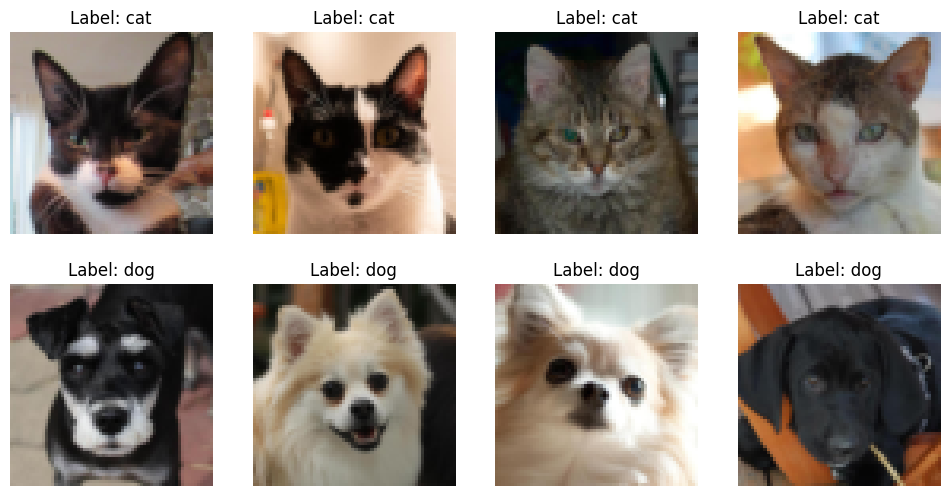

In [21]:
# Visualize a batch from both domains
show_cycleGAN_batch(cat_loader, dog_loader, classes)

# CycleGAN util functions

In [22]:
# CycleGAN Loss Functions
def gan_loss(pred, target_is_real):
    target = torch.ones_like(pred) if target_is_real else torch.zeros_like(pred)
    return F.mse_loss(pred, target)

def cycle_consistency_loss(reconstructed, real):
    return F.l1_loss(reconstructed, real)

# CycleGAN Training Loop

In [23]:
def visualize_cycleGAN_training(G_AB, G_BA, cat_loader, dog_loader, device, epoch=None):
    G_AB.eval()
    G_BA.eval()
    cat_images, _ = next(iter(cat_loader))
    dog_images, _ = next(iter(dog_loader))
    cat_images = cat_images.to(device)
    dog_images = dog_images.to(device)
    with torch.no_grad():
        fake_dogs = G_AB(cat_images[:4])
        rec_cats = G_BA(fake_dogs)
        fake_cats = G_BA(dog_images[:4])
        rec_dogs = G_AB(fake_cats)
    images = torch.cat([cat_images[:4], fake_dogs, rec_cats, dog_images[:4], fake_cats, rec_dogs], dim=0)
    # images = images * 0.5 + 0.5
    titles = ["Real Cat"]*4 + ["Cat→Dog"]*4 + ["Cat→Dog→Cat"]*4 + ["Real Dog"]*4 + ["Dog→Cat"]*4 + ["Dog→Cat→Dog"]*4
    plt.figure(figsize=(18, 8))
    for i in range(24):
        plt.subplot(3, 8, i + 1)
        plt.imshow(np.transpose(images[i].cpu().numpy(), (1, 2, 0)))
        plt.title(titles[i])
        plt.axis('off')
    if epoch is not None:
        plt.suptitle(f"CycleGAN Results at Epoch {epoch}")
    plt.show()

Epoch 1: G_loss=145.99, D_A_loss=6.69, D_B_loss=6.57


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06983085..0.9986958].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10609988..0.97787434].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.085950844..0.99325883].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0049858377..0.9926812].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09644518..0.99614].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.046576295..0.98968816].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range

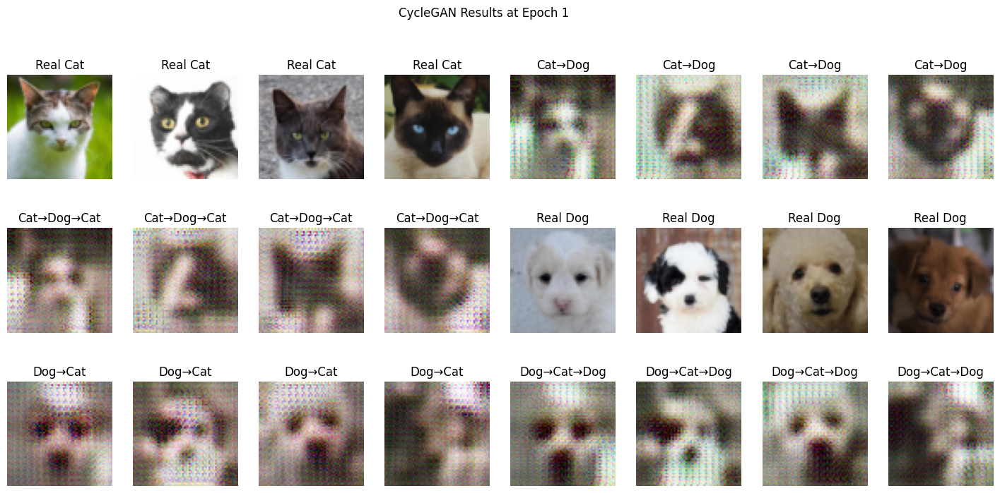

Epoch 2: G_loss=97.33, D_A_loss=4.21, D_B_loss=4.33
Epoch 3: G_loss=92.40, D_A_loss=4.18, D_B_loss=3.75
Epoch 4: G_loss=86.98, D_A_loss=3.69, D_B_loss=3.67
Epoch 5: G_loss=87.58, D_A_loss=3.76, D_B_loss=3.83


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06898886..0.96679664].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.008582094..0.9714865].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.01902051..0.97819644].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.056552377..0.96962106].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1269995..0.97961843].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10873225..0.9757024].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range

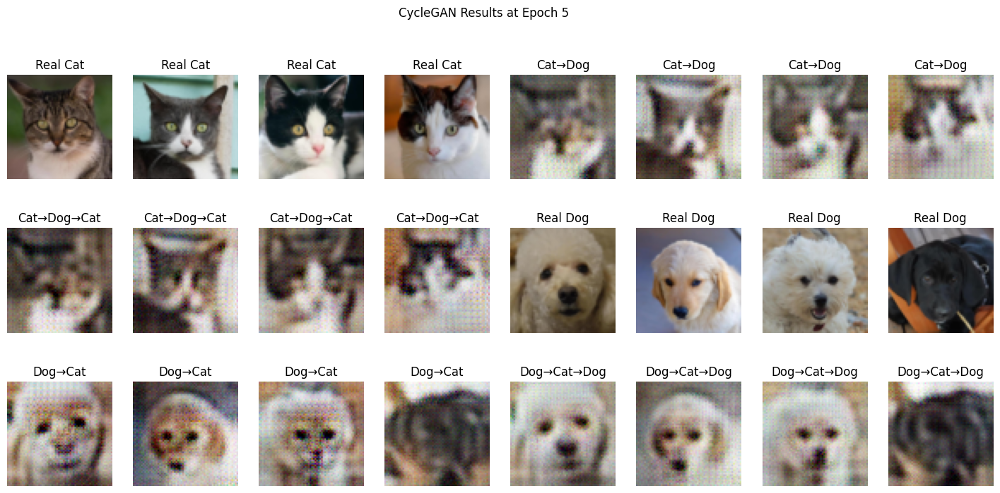

Epoch 6: G_loss=81.96, D_A_loss=3.62, D_B_loss=3.39
Epoch 7: G_loss=83.50, D_A_loss=3.39, D_B_loss=3.65
Epoch 8: G_loss=79.62, D_A_loss=3.36, D_B_loss=3.32
Epoch 9: G_loss=78.87, D_A_loss=3.31, D_B_loss=3.63
Epoch 10: G_loss=80.21, D_A_loss=3.29, D_B_loss=3.15


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13132998..0.9895576].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07794016..0.97155106].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20411725..0.97999376].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1203683..0.9598433].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.062285878..0.9986947].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.006485091..0.98175037].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range 

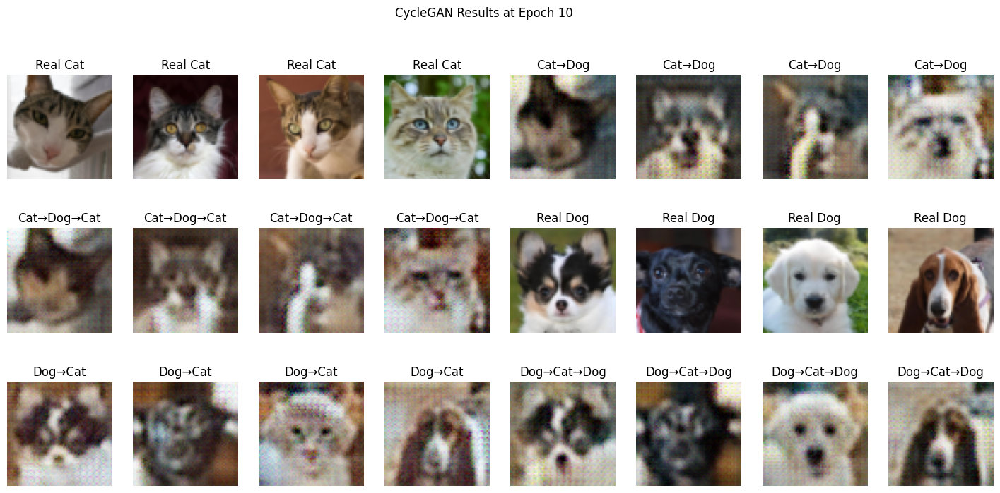

Epoch 11: G_loss=80.31, D_A_loss=3.28, D_B_loss=3.59
Epoch 12: G_loss=75.51, D_A_loss=3.13, D_B_loss=3.37
Epoch 13: G_loss=75.74, D_A_loss=3.31, D_B_loss=3.12
Epoch 14: G_loss=77.45, D_A_loss=3.16, D_B_loss=3.56
Epoch 15: G_loss=71.29, D_A_loss=3.67, D_B_loss=3.22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15624131..0.97551054].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08666573..0.97099894].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.037592907..0.93265486].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08526764..0.9488205].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048475802..0.9696562].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.082327925..0.9718287].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got rang

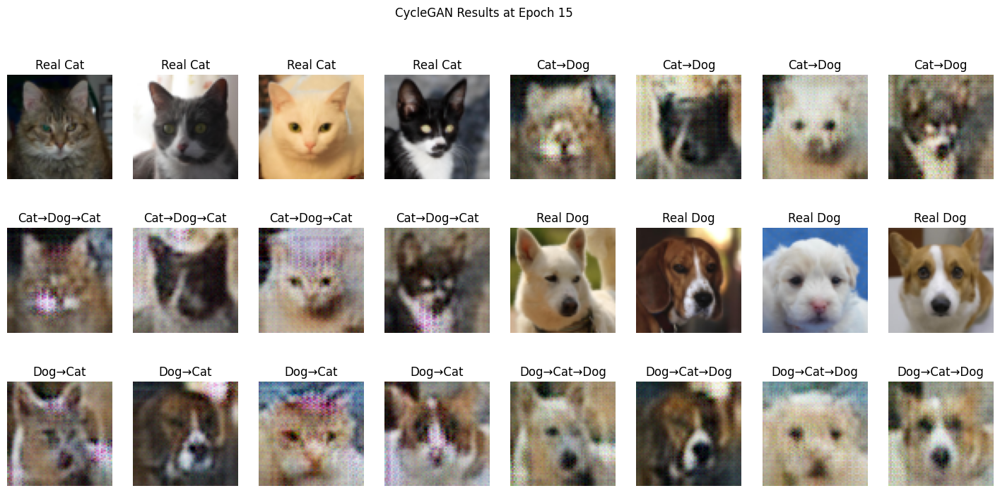

Epoch 16: G_loss=75.28, D_A_loss=3.41, D_B_loss=3.69
Epoch 17: G_loss=70.71, D_A_loss=2.89, D_B_loss=3.06
Epoch 18: G_loss=70.47, D_A_loss=3.03, D_B_loss=3.16
Epoch 19: G_loss=71.39, D_A_loss=3.31, D_B_loss=3.60
Epoch 20: G_loss=71.58, D_A_loss=3.82, D_B_loss=2.82


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16884021..0.9977772].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0290971..0.9999739].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.21374558..0.99994373].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17953812..0.99987].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0054873857..0.9450024].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.041061312..0.98722005].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-

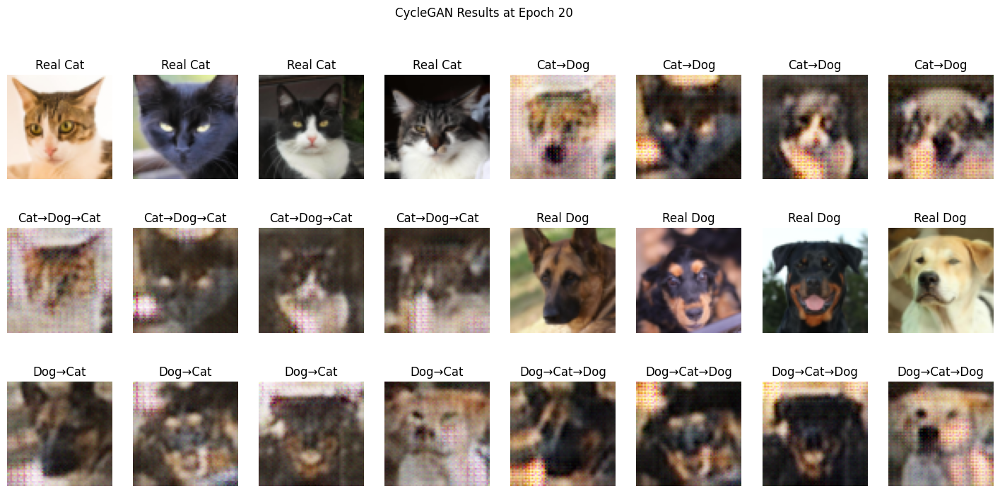

Epoch 21: G_loss=68.11, D_A_loss=2.85, D_B_loss=3.16
Epoch 22: G_loss=68.97, D_A_loss=2.64, D_B_loss=2.93
Epoch 23: G_loss=68.29, D_A_loss=3.29, D_B_loss=3.10
Epoch 24: G_loss=68.20, D_A_loss=2.65, D_B_loss=3.25
Epoch 25: G_loss=70.50, D_A_loss=3.77, D_B_loss=2.95


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08938709..0.96960807].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13484716..0.9294059].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12542246..0.9760102].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13162029..0.9723091].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07604702..0.9754377].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.004398176..0.9581761].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-

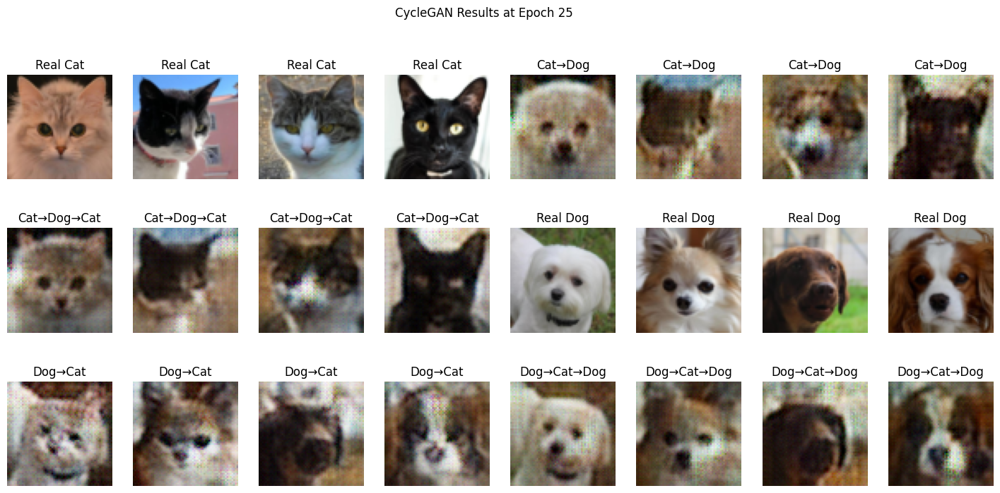

Epoch 26: G_loss=66.70, D_A_loss=2.65, D_B_loss=2.63
Epoch 27: G_loss=66.68, D_A_loss=2.78, D_B_loss=3.19
Epoch 28: G_loss=69.00, D_A_loss=2.58, D_B_loss=2.79
Epoch 29: G_loss=67.40, D_A_loss=3.09, D_B_loss=2.85
Epoch 30: G_loss=65.53, D_A_loss=2.81, D_B_loss=2.70


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.033102922..0.98843986].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12376835..0.9929417].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13370436..0.9783689].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17429964..0.9838155].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.044112023..0.98915094].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05677109..0.98587906].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range

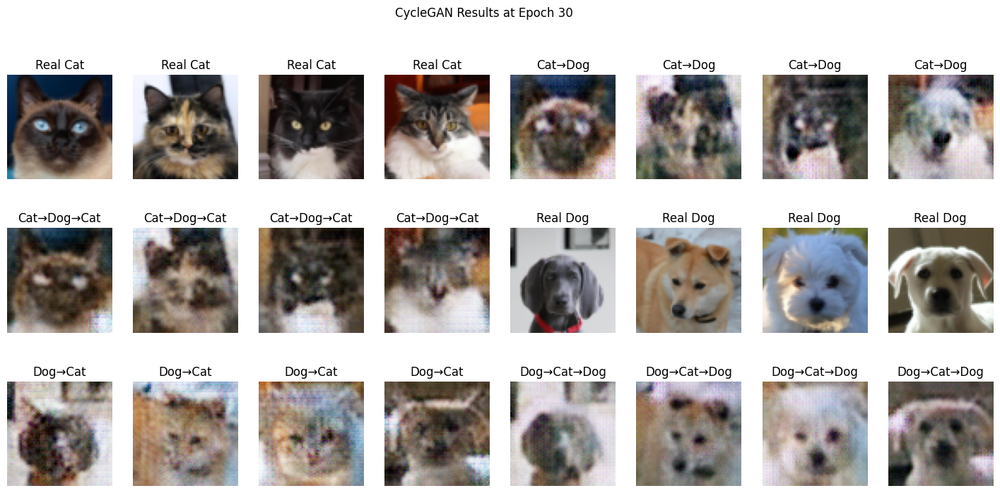

Epoch 31: G_loss=69.25, D_A_loss=2.70, D_B_loss=3.37
Epoch 32: G_loss=66.28, D_A_loss=2.68, D_B_loss=2.31
Epoch 33: G_loss=66.42, D_A_loss=2.66, D_B_loss=2.76
Epoch 34: G_loss=64.04, D_A_loss=2.48, D_B_loss=2.39
Epoch 35: G_loss=66.23, D_A_loss=3.09, D_B_loss=2.38


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.23337129..0.97384053].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15580773..0.9666031].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1211841..0.9406859].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.33040988..0.99112386].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07794607..0.9816518].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10927629..0.9584296].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0

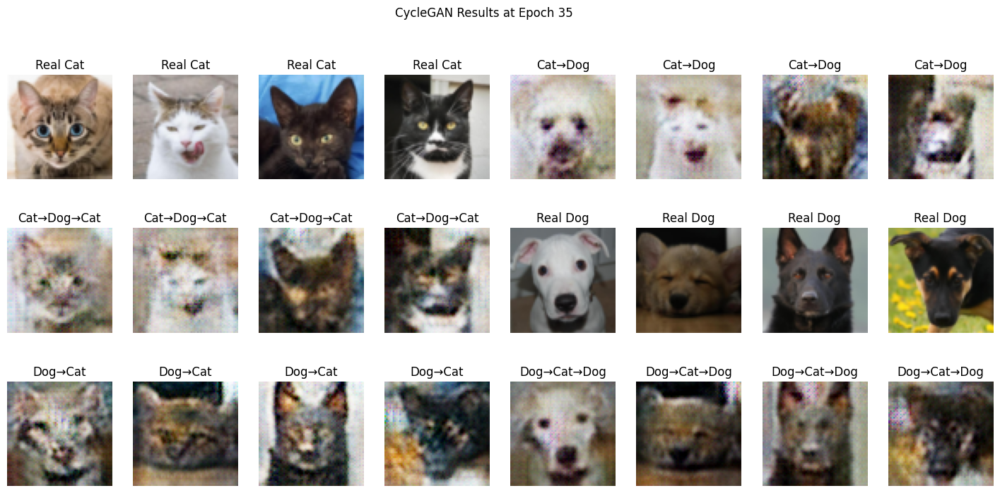

Epoch 36: G_loss=65.50, D_A_loss=2.54, D_B_loss=4.56
Epoch 37: G_loss=60.70, D_A_loss=2.63, D_B_loss=2.43
Epoch 38: G_loss=66.75, D_A_loss=2.40, D_B_loss=2.45
Epoch 39: G_loss=63.22, D_A_loss=2.77, D_B_loss=2.77
Epoch 40: G_loss=65.43, D_A_loss=2.56, D_B_loss=1.94


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07160217..0.9703669].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09024886..0.97177213].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15001372..0.9826471].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10998943..0.9665798].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03151989..0.92758113].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.116753995..0.96728003].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range 

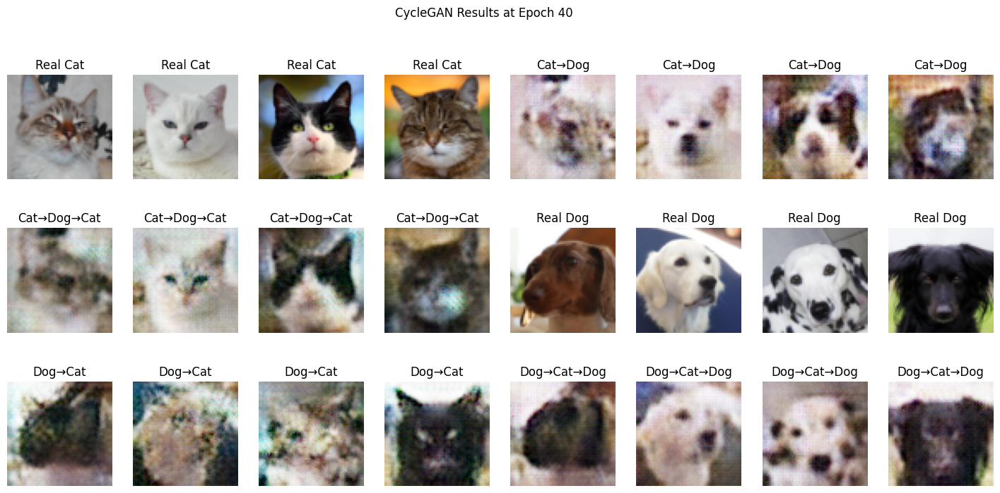

Epoch 41: G_loss=63.83, D_A_loss=2.62, D_B_loss=2.92
Epoch 42: G_loss=62.52, D_A_loss=2.42, D_B_loss=2.03
Epoch 43: G_loss=62.90, D_A_loss=2.68, D_B_loss=2.21
Epoch 44: G_loss=68.12, D_A_loss=2.42, D_B_loss=6.22
Epoch 45: G_loss=103.84, D_A_loss=1.82, D_B_loss=26.51


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.102080375..0.9354526].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09941469..0.964983].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.054860607..0.9297092].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.066049024..0.98701465].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.022039158..0.9701857].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07958579..0.97607845].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range

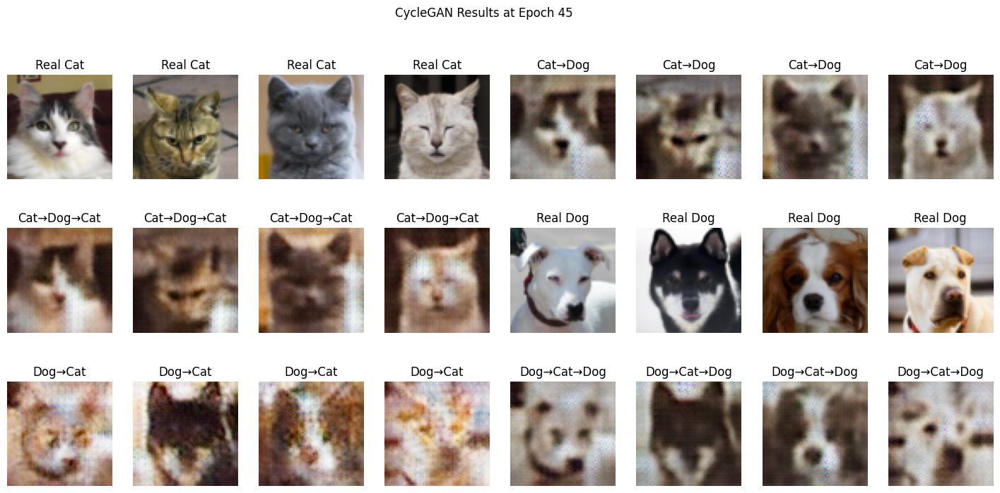

Epoch 46: G_loss=68.23, D_A_loss=1.95, D_B_loss=4.37
Epoch 47: G_loss=60.62, D_A_loss=2.12, D_B_loss=4.51
Epoch 48: G_loss=58.44, D_A_loss=2.35, D_B_loss=4.47
Epoch 49: G_loss=57.40, D_A_loss=2.27, D_B_loss=4.44
Epoch 50: G_loss=55.11, D_A_loss=2.64, D_B_loss=4.44


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10491555..0.93168396].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.018479452..0.95581657].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.053077687..0.9441012].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.032284282..0.96936804].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.013867161..0.98049676].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.007261331..0.9805725].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got r

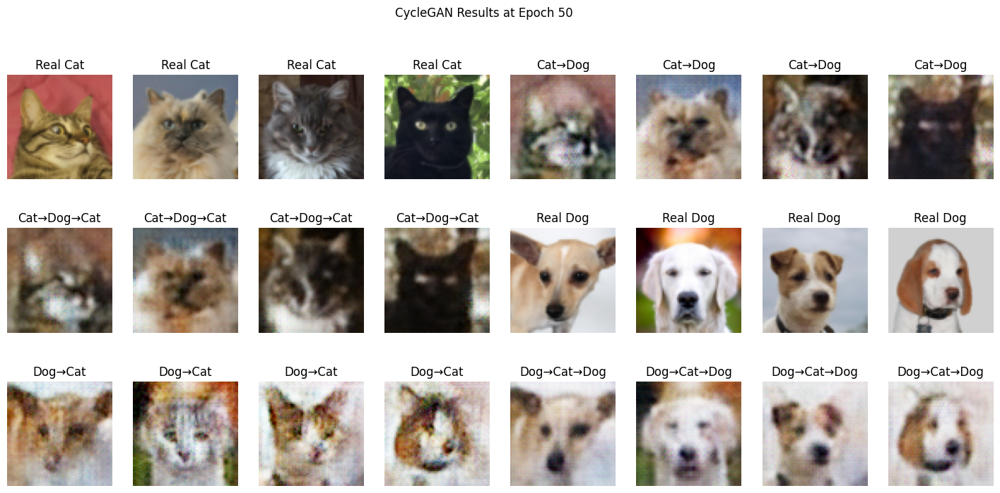

In [24]:
# Training loop for CycleGAN with visualization
num_epochs = 50
lambda_cycle = 10.0
display_interval = 5  # Visualize every N epochs
for epoch in range(1, num_epochs + 1):
    G_AB.train()
    G_BA.train()
    D_A.train()
    D_B.train()
    total_G_loss, total_D_A_loss, total_D_B_loss = 0, 0, 0
    for (real_A, _), (real_B, _) in zip(cat_loader, dog_loader):
        real_A, real_B = real_A.to(device), real_B.to(device)
        # ------------------ Train Generators ------------------
        optimizer_G.zero_grad()
        # Identity loss (optional, helps color preservation)
        idt_B = G_AB(real_B)
        idt_A = G_BA(real_A)
        loss_idt_B = F.l1_loss(idt_B, real_B) * lambda_cycle * 0.5
        loss_idt_A = F.l1_loss(idt_A, real_A) * lambda_cycle * 0.5
        # GAN loss
        fake_B = G_AB(real_A)
        pred_fake_B = D_B(fake_B)
        loss_GAN_AB = gan_loss(pred_fake_B, True)
        fake_A = G_BA(real_B)
        pred_fake_A = D_A(fake_A)
        loss_GAN_BA = gan_loss(pred_fake_A, True)
        # Cycle-consistency loss
        rec_A = G_BA(fake_B)
        rec_B = G_AB(fake_A)
        loss_cycle_A = cycle_consistency_loss(rec_A, real_A) * lambda_cycle
        loss_cycle_B = cycle_consistency_loss(rec_B, real_B) * lambda_cycle
        # Total generator loss
        loss_G = loss_GAN_AB + loss_GAN_BA + loss_cycle_A + loss_cycle_B + loss_idt_A + loss_idt_B
        loss_G.backward()
        optimizer_G.step()
        total_G_loss += loss_G.item()
        # ------------------ Train Discriminator A ------------------
        optimizer_D_A.zero_grad()
        pred_real_A = D_A(real_A)
        loss_D_real_A = gan_loss(pred_real_A, True)
        pred_fake_A = D_A(fake_A.detach())
        loss_D_fake_A = gan_loss(pred_fake_A, False)
        loss_D_A = (loss_D_real_A + loss_D_fake_A) * 0.5
        loss_D_A.backward()
        optimizer_D_A.step()
        total_D_A_loss += loss_D_A.item()
        # ------------------ Train Discriminator B ------------------
        optimizer_D_B.zero_grad()
        pred_real_B = D_B(real_B)
        loss_D_real_B = gan_loss(pred_real_B, True)
        pred_fake_B = D_B(fake_B.detach())
        loss_D_fake_B = gan_loss(pred_fake_B, False)
        loss_D_B = (loss_D_real_B + loss_D_fake_B) * 0.5
        loss_D_B.backward()
        optimizer_D_B.step()
        total_D_B_loss += loss_D_B.item()
    print(f"Epoch {epoch}: G_loss={total_G_loss:.2f}, D_A_loss={total_D_A_loss:.2f}, D_B_loss={total_D_B_loss:.2f}")
    # --- Visualization during training ---
    if epoch % display_interval == 0 or epoch == 1 or epoch == num_epochs:
        visualize_cycleGAN_training(G_AB, G_BA, cat_loader, dog_loader, device, epoch)

# Visualize CycleGAN output

In [25]:
# Visualize CycleGAN results
def visualize_cycleGAN(G_AB, G_BA, cat_loader, dog_loader, device):
    G_AB.eval()
    G_BA.eval()
    cat_images, _ = next(iter(cat_loader))
    dog_images, _ = next(iter(dog_loader))
    cat_images = cat_images.to(device)
    dog_images = dog_images.to(device)
    with torch.no_grad():
        fake_dogs = G_AB(cat_images[:4])
        rec_cats = G_BA(fake_dogs)
        fake_cats = G_BA(dog_images[:4])
        rec_dogs = G_AB(fake_cats)
    images = torch.cat([cat_images[:4], fake_dogs, rec_cats, dog_images[:4], fake_cats, rec_dogs], dim=0)
    titles = ["Real Cat"]*4 + ["Cat→Dog"]*4 + ["Cat→Dog→Cat"]*4 + ["Real Dog"]*4 + ["Dog→Cat"]*4 + ["Dog→Cat→Dog"]*4
    plt.figure(figsize=(18, 8))
    for i in range(24):
        plt.subplot(3, 8, i + 1)
        plt.imshow(np.transpose(images[i].cpu().numpy(), (1, 2, 0)))
        plt.title(titles[i])
        plt.axis('off')
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.036181916..0.95389014].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.013569593..0.96131134].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.057668656..0.9738689].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.066316575..0.9577297].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.034476653..0.9828719].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.050483666..0.9595575].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got ra

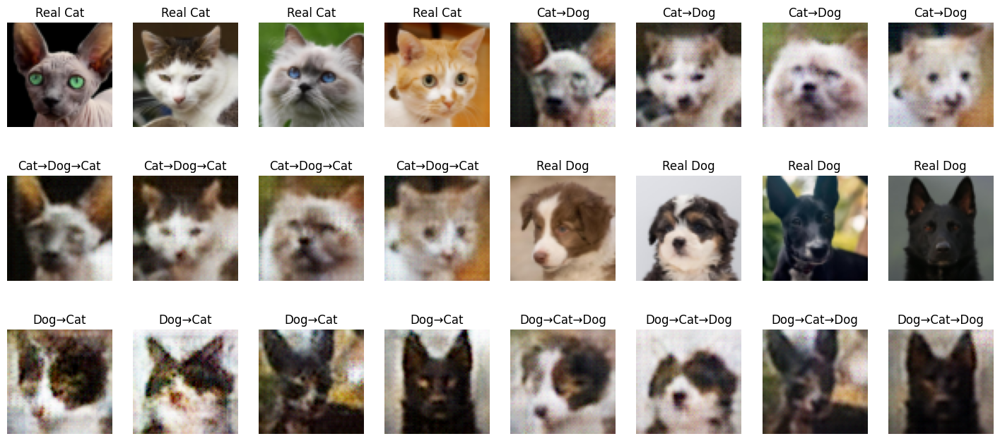

In [26]:
# Example: Visualize CycleGAN output after training
visualize_cycleGAN(G_AB, G_BA, cat_loader, dog_loader, device)